In [22]:
pip install ydata-profiling

In [95]:
import pandas as pd
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler,LabelEncoder, OneHotEncoder
from sklearn.cluster import AgglomerativeClustering
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [53]:
dataset1 = pd.read_csv('customer_segmentation.csv')
dataset2 = pd.read_csv('Mall_Customers.csv')

In [25]:
dataset1.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [26]:
dataset2.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


##**Exploratory Data Analysis**

**Here is a comprehensive report on dataset1**

In [27]:
report = ProfileReport(dataset1)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Here is a comprehensive report on dataset2**

In [28]:
report = ProfileReport(dataset2)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##**Data Cleaning**

Based on corelation alerts droping CustomerID

In [54]:
dataset2 = dataset2.drop(['CustomerID'], axis=1)


Converting string columns into categorical values using label encoding

In [55]:
dataset2.head()


,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,Male,19,15,39
1,Male,21,15,81
2,Female,20,16,6
3,Female,23,16,77
4,Female,31,17,40


In [56]:
label_encoder = LabelEncoder()
dataset1['Education'] = label_encoder.fit_transform(dataset1['Education'])
dataset1['Marital_Status'] = label_encoder.fit_transform(dataset1['Marital_Status'])
dataset2['Gender'] = label_encoder.fit_transform(dataset2['Gender'])

In [57]:
dataset1.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,2,4,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,2,4,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,2,5,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,2,5,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,4,3,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [50]:
dataset2.head()

,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,19,15,39
1,1,21,15,81
2,0,20,16,6
3,0,23,16,77
4,0,31,17,40


In [58]:
# Convert Dt_Customer to datetime format with correct format specified
dataset1['Dt_Customer'] = pd.to_datetime(dataset1['Dt_Customer'], format='%d-%m-%Y')


# Extract year, month, and day as separate columns
dataset1['Year'] = dataset1['Dt_Customer'].dt.year
dataset1['Month'] = dataset1['Dt_Customer'].dt.month
dataset1['Day'] = dataset1['Dt_Customer'].dt.day

# Drop original Dt_Customer column
dataset1.drop(columns=['Dt_Customer'], inplace=True)

# Apply one-hot encoding to Year, Month, and Day columns
encoder = OneHotEncoder(drop='first', sparse=False)
encoded_columns = encoder.fit_transform(dataset1[['Year', 'Month', 'Day']])

# Create new column names for the encoded columns
encoded_column_names = encoder.get_feature_names_out(['Year', 'Month', 'Day'])

# Replace original columns with the encoded columns
dataset1.drop(columns=['Year', 'Month', 'Day'], inplace=True)
dataset1[encoded_column_names] = encoded_columns

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [59]:
dataset1.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,...,Day_22,Day_23,Day_24,Day_25,Day_26,Day_27,Day_28,Day_29,Day_30,Day_31
0,5524,1957,2,4,58138.0,0,0,58,635,88,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2174,1954,2,4,46344.0,1,1,38,11,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4141,1965,2,5,71613.0,0,0,26,426,49,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,6182,1984,2,5,26646.0,1,0,26,11,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5324,1981,4,3,58293.0,1,0,94,173,43,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Apply data standardization

In [63]:
dataset1 = dataset1.dropna()
dataset2 = dataset2.dropna()

In [65]:
# Standardize the data
scaler = StandardScaler()
dataset1_scaled = scaler.fit_transform(dataset1)
dataset2_scaled = scaler.fit_transform(dataset2)

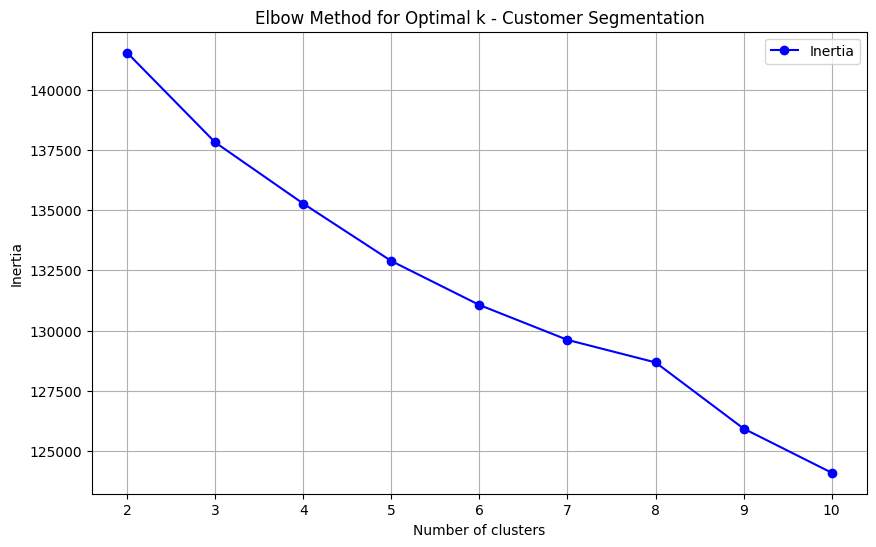

Best number of clusters for Customer Segmentation: 2
Silhouette Score for best K-Means clustering: 0.08427853813617325
Davies-Bouldin Index for best K-Means clustering: 3.4590265123558006


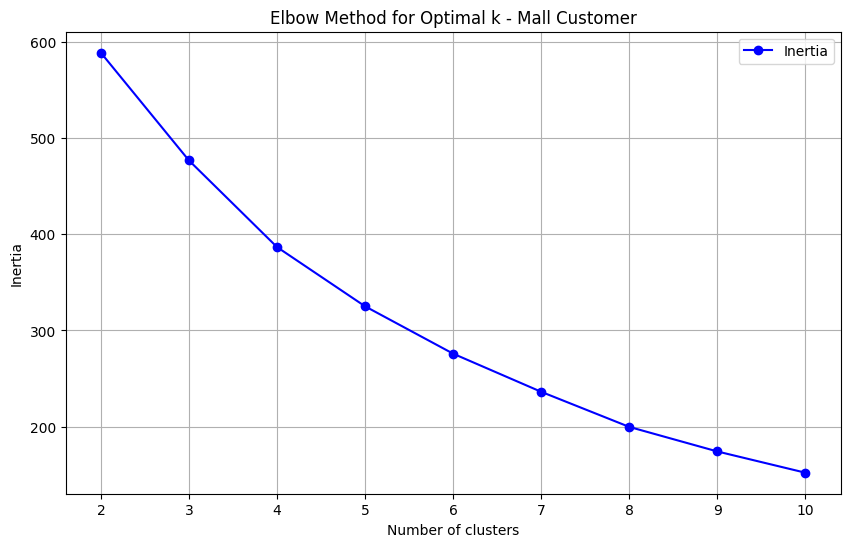

Best number of clusters for Mall Customer: 10
Silhouette Score for best K-Means clustering: 0.420342376994601
Davies-Bouldin Index for best K-Means clustering: 0.8337572775954563


In [89]:
# Determine the optimal number of clusters using the elbow method

# For dataset1 (Customer Segmentation)
inertia1 = []
silhouette_scores1 = []
db_index_scores1 = []
max_clusters = 10  # Maximum number of clusters to try

for k in range(2, max_clusters + 1):
    kmeans1 = KMeans(n_clusters=k, random_state=42)
    kmeans1.fit(dataset1_scaled)
    inertia1.append(kmeans1.inertia_)
    silhouette_scores1.append(silhouette_score(dataset1_scaled, kmeans1.labels_))
    db_index_scores1.append(davies_bouldin_score(dataset1_scaled, kmeans1.labels_))

# Plotting the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(2, max_clusters + 1), inertia1, marker='o', linestyle='-', color='b', label='Inertia')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k - Customer Segmentation')
plt.xticks(np.arange(2, max_clusters + 1, 1))
plt.legend()
plt.grid(True)
plt.show()

# Print silhouette scores and Davies-Bouldin index for dataset1
best_k1 = silhouette_scores1.index(max(silhouette_scores1)) + 2  # Add 2 because range starts from 2
print(f"Best number of clusters for Customer Segmentation: {best_k1}")
print(f"Silhouette Score for best K-Means clustering: {max(silhouette_scores1)}")
print(f"Davies-Bouldin Index for best K-Means clustering: {db_index_scores1[best_k1 - 2]}")

# For dataset2 (Mall Customer)
inertia2 = []
silhouette_scores2 = []
db_index_scores2 = []

for k in range(2, max_clusters + 1):
    kmeans2 = KMeans(n_clusters=k, random_state=42)
    kmeans2.fit(dataset2_scaled)
    inertia2.append(kmeans2.inertia_)
    silhouette_scores2.append(silhouette_score(dataset2_scaled, kmeans2.labels_))
    db_index_scores2.append(davies_bouldin_score(dataset2_scaled, kmeans2.labels_))

# Plotting the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(2, max_clusters + 1), inertia2, marker='o', linestyle='-', color='b', label='Inertia')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k - Mall Customer')
plt.xticks(np.arange(2, max_clusters + 1, 1))
plt.legend()
plt.grid(True)
plt.show()

# Print silhouette scores and Davies-Bouldin index for dataset2
best_k2 = silhouette_scores2.index(max(silhouette_scores2)) + 2  # Add 2 because range starts from 2
print(f"Best number of clusters for Mall Customer: {best_k2}")
print(f"Silhouette Score for best K-Means clustering: {max(silhouette_scores2)}")
print(f"Davies-Bouldin Index for best K-Means clustering: {db_index_scores2[best_k2 - 2]}")

Based on the analysis using K-Means clustering for the datasets:

1. **Customer Segmentation Dataset**:
   - The optimal number of clusters identified is 2, based on the elbow method using the inertia metric. This suggests that the data points in the Customer Segmentation dataset can be effectively grouped into two distinct clusters.
   - The silhouette score for this clustering configuration is 0.084, indicating that the clusters are not very well-separated or dense. A higher silhouette score closer to 1 would suggest more distinct clusters.
   - The Davies-Bouldin index for this configuration is 3.46, which is quite high. This index measures the average similarity between each cluster and its most similar cluster; a lower value indicates better separation between clusters.

2. **Mall Customer Dataset**:
   - The optimal number of clusters identified is 10, based on the elbow method using inertia. This indicates that the Mall Customer dataset can be partitioned into 10 clusters that capture the underlying patterns in the data effectively.
   - The silhouette score for this configuration is 0.420, which is relatively higher compared to the Customer Segmentation dataset. This suggests that the clusters in the Mall Customer dataset are more distinct and well-separated.
   - The Davies-Bouldin index for this configuration is 0.834, which is lower than that of the Customer Segmentation dataset. This lower value indicates better-defined and more compact clusters.

**Analysis**:
- **Customer Segmentation**: The low silhouette score and high Davies-Bouldin index suggest that the clusters identified may not be very well-separated or distinct. This could imply that the underlying structure in the data may not easily lend itself to clustering into clear segments with the features currently used.
  
- **Mall Customer**: In contrast, the higher silhouette score and lower Davies-Bouldin index indicate that the clusters in the Mall Customer dataset are more cohesive and distinguishable. This could imply that factors influencing customer behavior in malls might be more varied and complex, allowing for clearer segmentation.

In both cases, further exploration could involve refining feature selection, exploring different clustering algorithms or preprocessing techniques, or considering additional domain knowledge to improve cluster quality and interpretability. Adjustments such as these could potentially lead to more meaningful segmentation and insights from the datasets.

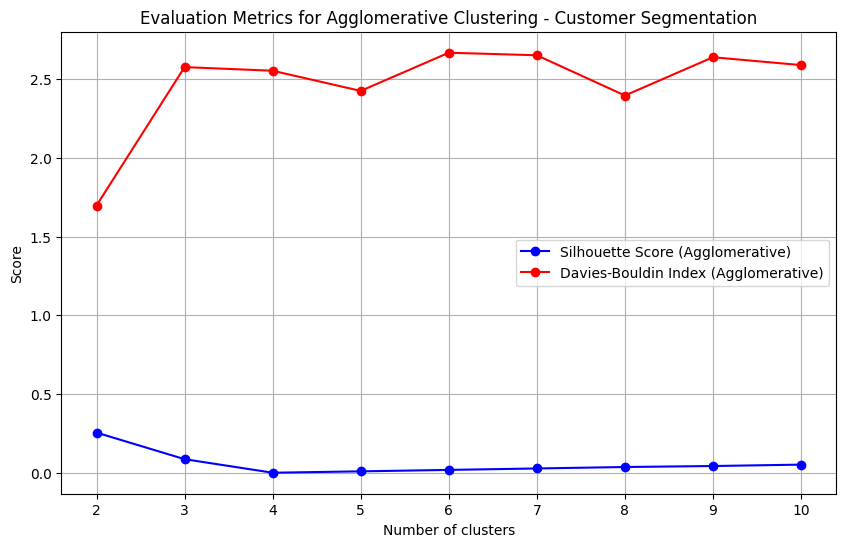

Best number of clusters for Customer Segmentation (Agglomerative): 2
Silhouette Score for best Agglomerative clustering: 0.2551837564530958
Davies-Bouldin Index for best Agglomerative clustering: 1.6967729995658969


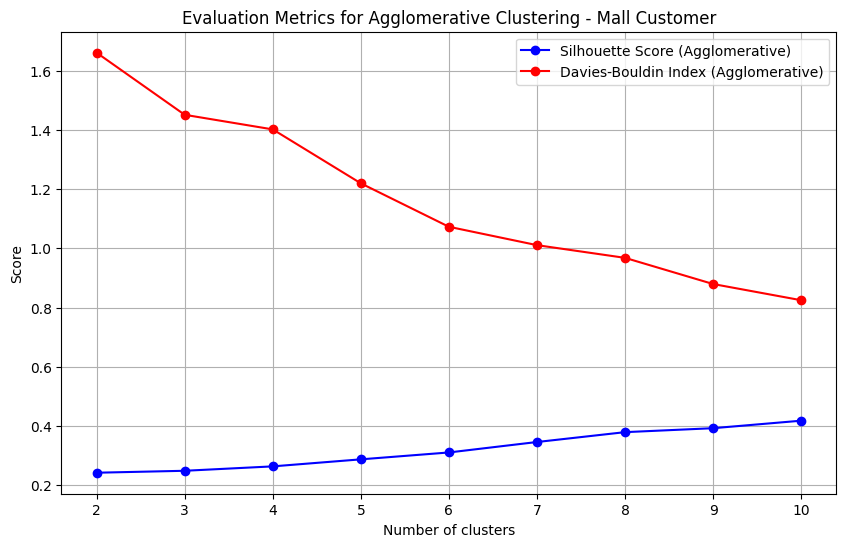

Best number of clusters for Mall Customer (Agglomerative): 10
Silhouette Score for best Agglomerative clustering: 0.4176254448686808
Davies-Bouldin Index for best Agglomerative clustering: 0.8247121765670091


In [96]:
# Determine the optimal number of clusters using Agglomerative Clustering

# For dataset1 (Customer Segmentation)
silhouette_scores1_agg = []
db_index_scores1_agg = []

max_clusters = 10  # Maximum number of clusters to try

for k in range(2, max_clusters + 1):
    agg_clustering1 = AgglomerativeClustering(n_clusters=k)
    agg_clustering1.fit(dataset1_scaled)
    silhouette_scores1_agg.append(silhouette_score(dataset1_scaled, agg_clustering1.labels_))
    db_index_scores1_agg.append(davies_bouldin_score(dataset1_scaled, agg_clustering1.labels_))

# Plotting silhouette score and Davies-Bouldin index for Agglomerative Clustering - dataset1
plt.figure(figsize=(10, 6))
plt.plot(range(2, max_clusters + 1), silhouette_scores1_agg, marker='o', linestyle='-', color='b', label='Silhouette Score (Agglomerative)')
plt.plot(range(2, max_clusters + 1), db_index_scores1_agg, marker='o', linestyle='-', color='r', label='Davies-Bouldin Index (Agglomerative)')
plt.xlabel('Number of clusters')
plt.ylabel('Score')
plt.title('Evaluation Metrics for Agglomerative Clustering - Customer Segmentation')
plt.xticks(np.arange(2, max_clusters + 1, 1))
plt.legend()
plt.grid(True)
plt.show()

# Print results for Agglomerative Clustering - dataset1
best_k1_agg = silhouette_scores1_agg.index(max(silhouette_scores1_agg)) + 2  # Add 2 because range starts from 2
print(f"Best number of clusters for Customer Segmentation (Agglomerative): {best_k1_agg}")
print(f"Silhouette Score for best Agglomerative clustering: {max(silhouette_scores1_agg)}")
print(f"Davies-Bouldin Index for best Agglomerative clustering: {db_index_scores1_agg[best_k1_agg - 2]}")

# For dataset2 (Mall Customer)
silhouette_scores2_agg = []
db_index_scores2_agg = []

for k in range(2, max_clusters + 1):
    agg_clustering2 = AgglomerativeClustering(n_clusters=k)
    agg_clustering2.fit(dataset2_scaled)
    silhouette_scores2_agg.append(silhouette_score(dataset2_scaled, agg_clustering2.labels_))
    db_index_scores2_agg.append(davies_bouldin_score(dataset2_scaled, agg_clustering2.labels_))

# Plotting silhouette score and Davies-Bouldin index for Agglomerative Clustering - dataset2
plt.figure(figsize=(10, 6))
plt.plot(range(2, max_clusters + 1), silhouette_scores2_agg, marker='o', linestyle='-', color='b', label='Silhouette Score (Agglomerative)')
plt.plot(range(2, max_clusters + 1), db_index_scores2_agg, marker='o', linestyle='-', color='r', label='Davies-Bouldin Index (Agglomerative)')
plt.xlabel('Number of clusters')
plt.ylabel('Score')
plt.title('Evaluation Metrics for Agglomerative Clustering - Mall Customer')
plt.xticks(np.arange(2, max_clusters + 1, 1))
plt.legend()
plt.grid(True)
plt.show()

# Print results for Agglomerative Clustering - dataset2
best_k2_agg = silhouette_scores2_agg.index(max(silhouette_scores2_agg)) + 2  # Add 2 because range starts from 2
print(f"Best number of clusters for Mall Customer (Agglomerative): {best_k2_agg}")
print(f"Silhouette Score for best Agglomerative clustering: {max(silhouette_scores2_agg)}")
print(f"Davies-Bouldin Index for best Agglomerative clustering: {db_index_scores2_agg[best_k2_agg - 2]}")

Based on the analysis using Agglomerative Clustering for the datasets:

1. **Customer Segmentation Dataset**:
   - The optimal number of clusters identified is 2, indicating that the Customer Segmentation dataset can be effectively grouped into two clusters using hierarchical clustering.
   - The silhouette score for this clustering configuration is 0.255, which is higher than that obtained with K-Means clustering. This suggests that the clusters identified by Agglomerative Clustering are more internally cohesive and better separated.
   - The Davies-Bouldin index for this configuration is 1.697, which is lower than that obtained with K-Means clustering. A lower Davies-Bouldin index indicates better-defined and more compact clusters.

2. **Mall Customer Dataset**:
   - The optimal number of clusters identified is 10, based on the hierarchical clustering method.
   - The silhouette score for this configuration is 0.418, which is slightly higher than that obtained with K-Means clustering. This suggests that Agglomerative Clustering also effectively partitions the Mall Customer dataset into distinct and well-separated clusters.
   - The Davies-Bouldin index for this configuration is 0.825, which is slightly lower than that obtained with K-Means clustering. This lower index indicates better separation between clusters and improved cluster quality.

**Analysis**:
- **Customer Segmentation**: Agglomerative Clustering reveals a higher silhouette score and a lower Davies-Bouldin index compared to K-Means clustering. This indicates that hierarchical clustering might be more suitable for identifying meaningful segments in the Customer Segmentation dataset, possibly due to its ability to capture hierarchical relationships in the data.
  
- **Mall Customer**: Similarly, Agglomerative Clustering shows comparable or slightly improved clustering metrics compared to K-Means clustering. This suggests that hierarchical clustering can effectively capture the complex structure of customer behavior in malls, resulting in more distinct and interpretable clusters.

In conclusion, Agglomerative Clustering appears to provide competitive or slightly better clustering results for both datasets compared to K-Means clustering in terms of silhouette score and Davies-Bouldin index. Further exploration could involve refining clustering parameters or exploring additional clustering algorithms to further enhance clustering performance and derive actionable insights from the datasets.